In [1095]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
df1 = pd.read_csv("E:/dasein_py/Data Analysis/招商银行/train.csv", index_col = 0, header =0)
df2 = pd.read_csv("E:/dasein_py/Data Analysis/招商银行/test_A榜.csv", index_col = 0, header =0)
info = pd.read_csv("E:/dasein_py/Data Analysis/招商银行/特征说明.csv", index_col =0, header =1)

In [1096]:
df1.isnull().sum()

LABEL                                          0
AGN_CNT_RCT_12_MON                             0
ICO_CUR_MON_ACM_TRX_TM                         0
NB_RCT_3_MON_LGN_TMS_AGV                       0
AGN_CUR_YEAR_AMT                               0
AGN_CUR_YEAR_WAG_AMT                           0
AGN_AGR_LATEST_AGN_AMT                         0
ICO_CUR_MON_ACM_TRX_AMT                        0
COUNTER_CUR_YEAR_CNT_AMT                       0
PUB_TO_PRV_TRX_AMT_CUR_YEAR                    0
MON_12_EXT_SAM_TRSF_IN_AMT                     0
MON_12_EXT_SAM_TRSF_OUT_AMT                    0
MON_12_EXT_SAM_NM_TRSF_OUT_CNT                 0
MON_12_EXT_SAM_AMT                             0
CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT               0
CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT              0
MON_12_CUST_CNT_PTY_ID                     22830
MON_12_TRX_AMT_MAX_AMT_PCTT                    0
CUR_YEAR_MON_AGV_TRX_CNT                       0
MON_12_AGV_TRX_CNT                             0
MON_12_ACM_ENTR_ACT_

In [1097]:
df1.reset_index(inplace =True)
df2.reset_index(inplace =True)

In [1098]:
df1.drop(columns ='CUST_UID', inplace = True)
df2.drop(columns ='CUST_UID', inplace = True)
df1.head()

,LABEL,AGN_CNT_RCT_12_MON,ICO_CUR_MON_ACM_TRX_TM,NB_RCT_3_MON_LGN_TMS_AGV,AGN_CUR_YEAR_AMT,AGN_CUR_YEAR_WAG_AMT,AGN_AGR_LATEST_AGN_AMT,ICO_CUR_MON_ACM_TRX_AMT,COUNTER_CUR_YEAR_CNT_AMT,PUB_TO_PRV_TRX_AMT_CUR_YEAR,...,WTHR_OPN_ONL_ICO,EMP_NBR,REG_CPT,SHH_BCK,HLD_DMS_CCY_ACT_NBR,REG_DT,LGP_HLD_CARD_LVL,OPN_TM,NB_CTC_HLD_IDV_AIO_CARD_SITU,HLD_FGN_CCY_ACT_NBR
0,0,?,72,425.3,?,?,?,25879985.3,2,660732,...,B,2,1200000002,32,12,1708.45,?,416.84,?,2
1,0,2282,222,?,11776572.4,?,1964626.4,14755499.8,2,126608.3,...,B,1002,5000002,32,22,199.42,F,195.87,D,2
2,0,?,2,?,?,?,4599822.3,2,2,2,...,B,2,?,2,12,1135.55,F,1122,NaN,2
3,1,?,?,22,?,?,?,?,2,2,...,A,2,500002,12,12,98.45,NaN,92,C,2
4,1,?,?,?,?,?,?,?,?,?,...,A,2,?,2,12,?,NaN,355.87,C,2


In [1099]:
# MON_12_CUST_CNT_PTY_ID       
df1.drop(columns ='MON_12_CUST_CNT_PTY_ID', inplace = True)
df2.drop(columns ='MON_12_CUST_CNT_PTY_ID', inplace = True)

In [1100]:
quantitive = [i for i in info.index if info.loc[i,:].values[0] == '数值型' and i in df1.columns and i != 'CUST_UID']
quanlitive = [i for i in info.index if info.loc[i,:].values[0] == '字符型' and i in df1.columns and i != 'CUST_UID']

In [1101]:
df1[quantitive] = df1[quantitive].fillna(df1[quantitive].median())
df2[quantitive[1:]] = df2[quantitive[1:]].fillna(df2[quantitive[1:]].median())

C:\Users\TRACYT~1\AppData\Local\Temp/ipykernel_15724/992265126.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df1[quantitive] = df1[quantitive].fillna(df1[quantitive].median())
C:\Users\TRACYT~1\AppData\Local\Temp/ipykernel_15724/992265126.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df2[quantitive[1:]] = df2[quantitive[1:]].fillna(df2[quantitive[1:]].median())


In [1102]:
# quanlitive.remove('MON_12_CUST_CNT_PTY_ID')
quanlitive

['AI_STAR_SCO',
 'WTHR_OPN_ONL_ICO',
 'SHH_BCK',
 'LGP_HLD_CARD_LVL',
 'NB_CTC_HLD_IDV_AIO_CARD_SITU']

In [1103]:
df1[quanlitive] = df1[quanlitive].fillna(df1[quanlitive].mode())
df2[quanlitive] = df2[quanlitive].fillna(df2[quanlitive].mode())

In [1104]:
[df1[quantitive[i]].replace("?", df1[quantitive[i]][df1[quantitive[i]]!='?'].median(), inplace= True) for i in range(len(quantitive))]
[df2[quantitive[i]].replace("?", df2[quantitive[i]][df2[quantitive[i]]!='?'].median(), inplace= True) for i in range(1,len(quantitive))]

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [1105]:
df1[quanlitive] = df1[quanlitive].astype('str')
df2[quanlitive] = df2[quanlitive].astype('str')

In [1106]:
df1[quanlitive] = df1[quanlitive].apply(lambda x:pd.factorize(x)[0]) #转换成因子
df2[quanlitive] = df2[quanlitive].apply(lambda x:pd.factorize(x)[0]) #转换成因子

In [1107]:
df1= df1.apply(pd.to_numeric)
df2= df2.apply(pd.to_numeric)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 49 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   LABEL                                    40000 non-null  int64  
 1   AGN_CNT_RCT_12_MON                       40000 non-null  float64
 2   ICO_CUR_MON_ACM_TRX_TM                   40000 non-null  float64
 3   NB_RCT_3_MON_LGN_TMS_AGV                 40000 non-null  float64
 4   AGN_CUR_YEAR_AMT                         40000 non-null  float64
 5   AGN_CUR_YEAR_WAG_AMT                     40000 non-null  float64
 6   AGN_AGR_LATEST_AGN_AMT                   40000 non-null  float64
 7   ICO_CUR_MON_ACM_TRX_AMT                  40000 non-null  float64
 8   COUNTER_CUR_YEAR_CNT_AMT                 40000 non-null  float64
 9   PUB_TO_PRV_TRX_AMT_CUR_YEAR              40000 non-null  float64
 10  MON_12_EXT_SAM_TRSF_IN_AMT               40000

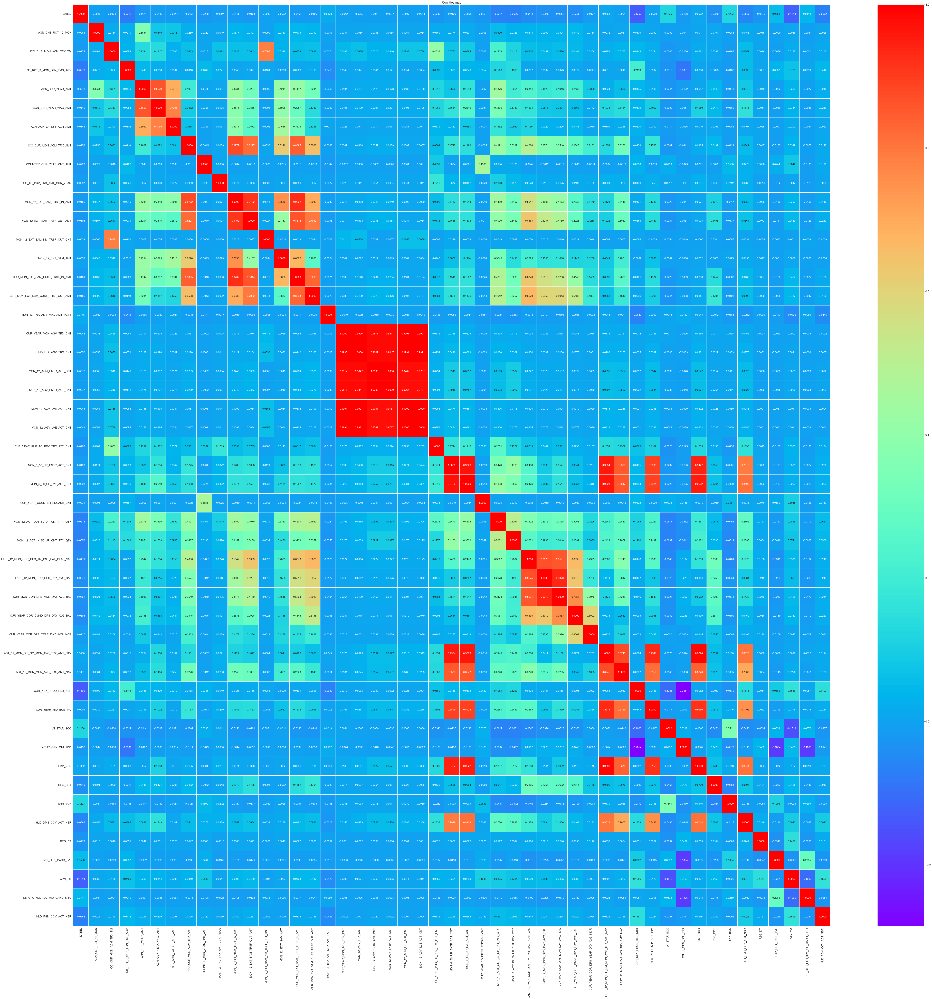

In [1108]:
import seaborn as sns
corr = df1.corr()
plt.figure(figsize=(100,100))
sns.set(font_scale=1.5)
ax=sns.heatmap(corr,
               xticklabels=corr.columns,
               yticklabels=corr.columns,
               linewidths=0.6,annot=True,
               cbar=True,cmap="rainbow",fmt='.4f',
               annot_kws={'size': 15})
plt.title("Corr Heatmap")
# plt.savefig("Corr Heatmap.png")
plt.show()

- 对多重共线性变量进行变量重组，并删除含义重复的变量。

In [1109]:
df1.columns

Index(['LABEL', 'AGN_CNT_RCT_12_MON', 'ICO_CUR_MON_ACM_TRX_TM',
       'NB_RCT_3_MON_LGN_TMS_AGV', 'AGN_CUR_YEAR_AMT', 'AGN_CUR_YEAR_WAG_AMT',
       'AGN_AGR_LATEST_AGN_AMT', 'ICO_CUR_MON_ACM_TRX_AMT',
       'COUNTER_CUR_YEAR_CNT_AMT', 'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
       'MON_12_EXT_SAM_TRSF_IN_AMT', 'MON_12_EXT_SAM_TRSF_OUT_AMT',
       'MON_12_EXT_SAM_NM_TRSF_OUT_CNT', 'MON_12_EXT_SAM_AMT',
       'CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT', 'CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT',
       'MON_12_TRX_AMT_MAX_AMT_PCTT', 'CUR_YEAR_MON_AGV_TRX_CNT',
       'MON_12_AGV_TRX_CNT', 'MON_12_ACM_ENTR_ACT_CNT',
       'MON_12_AGV_ENTR_ACT_CNT', 'MON_12_ACM_LVE_ACT_CNT',
       'MON_12_AGV_LVE_ACT_CNT', 'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
       'MON_6_50_UP_ENTR_ACT_CNT', 'MON_6_50_UP_LVE_ACT_CNT',
       'CUR_YEAR_COUNTER_ENCASH_CNT', 'MON_12_ACT_OUT_50_UP_CNT_PTY_QTY',
       'MON_12_ACT_IN_50_UP_CNT_PTY_QTY',
       'LAST_12_MON_COR_DPS_TM_PNT_BAL_PEAK_VAL',
       'LAST_12_MON_COR_DPS_DAY_AVG_BAL', 

In [1110]:
# CUR_YEAR_MON_AGV_TRX_CNT 前一年平均转出
# MON_12_AGV_TRX_CNT 12个月平均转出
# 矩阵运算计算 CAGR_YEARLY_AGV_TRX_CNT
df1['CAGR_YEARLY_AGV_TRX_CNT'] = np.power((df1['MON_12_AGV_TRX_CNT'] / df1['CUR_YEAR_MON_AGV_TRX_CNT']), 1) - 1

In [1111]:
df2['CAGR_YEARLY_AGV_TRX_CNT'] = np.power((df2['MON_12_AGV_TRX_CNT'] / df2['CUR_YEAR_MON_AGV_TRX_CNT']), 1) - 1

In [1112]:
df1.drop(columns = 'MON_12_AGV_TRX_CNT', inplace = True)

In [1113]:
df1.drop(columns = 'CUR_YEAR_MON_AGV_TRX_CNT', inplace = True)

In [1114]:
df2.drop(columns = 'MON_12_AGV_TRX_CNT', inplace = True)
df2.drop(columns = 'CUR_YEAR_MON_AGV_TRX_CNT', inplace = True)
quantitive.remove('MON_12_AGV_TRX_CNT')
quantitive.remove('CUR_YEAR_MON_AGV_TRX_CNT')

In [1115]:
df1['MON_12_ACM_ENTR_ACT_CNT'].describe() # 有离群值值，需要约束范围

count    4.000000e+04
mean     6.521794e+03
std      3.343042e+05
min      2.000000e+00
25%      1.420000e+02
50%      5.120000e+02
75%      1.962000e+03
max      6.521087e+07
Name: MON_12_ACM_ENTR_ACT_CNT, dtype: float64

In [1116]:
# df1 = df1[df1['MON_12_ACM_ENTR_ACT_CNT'] <= 1e4]
# df1.shape

D:\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


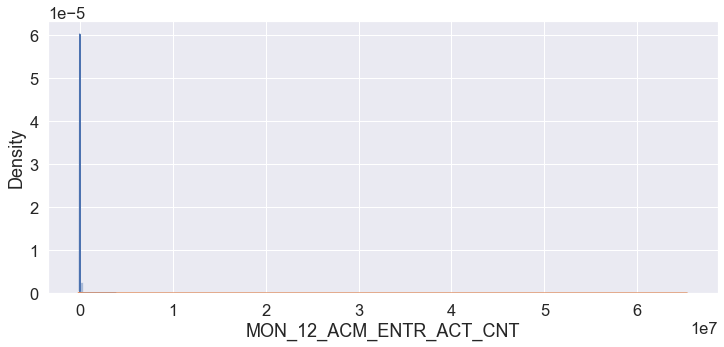

In [1117]:
# import matplotlib.gridspec as gridspec
plt.figure(figsize=(12,5))
sns.distplot(df1['MON_12_ACM_ENTR_ACT_CNT'][df1.LABEL == 1], bins=10)
sns.distplot(df1['MON_12_ACM_ENTR_ACT_CNT'][df1.LABEL == 0], bins=10)
ax.set_xlabel('')
ax.set_title('histogram of feature: ' + str('MON_12_ACM_ENTR_ACT'))
plt.show()

In [1118]:
df1['MON_12_AGV_ENTR_ACT_CNT'].describe() # 有离群值值，需要约束范围

count    4.000000e+04
mean     5.453160e+02
std      2.785868e+04
min      2.000000e+00
25%      1.370000e+01
50%      4.450000e+01
75%      1.653000e+02
max      5.434241e+06
Name: MON_12_AGV_ENTR_ACT_CNT, dtype: float64

In [1119]:
df1['MON_12_AGV_ENTR_ACT_CNT'] * 12 - df1['MON_12_ACM_ENTR_ACT_CNT'] # # MON_12_AGV_ENTR_ACT_CNT = MON_12_ACM_ENTR_ACT_CNT / 12 需要含义重复去除其一

0        22.0
1        22.0
2        22.4
3        22.0
4        22.0
         ... 
39995    22.0
39996    22.4
39997    22.0
39998    22.4
39999    21.6
Length: 40000, dtype: float64

In [1120]:
df1.drop(columns = 'MON_12_AGV_ENTR_ACT_CNT', inplace = True) # 个人感觉：累计入账少的更有可能流失

In [1121]:
df2.drop(columns = 'MON_12_AGV_ENTR_ACT_CNT', inplace = True) # 个人感觉：累计入账少的更有可能流失

In [1122]:
quantitive.remove('MON_12_AGV_ENTR_ACT_CNT')

D:\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


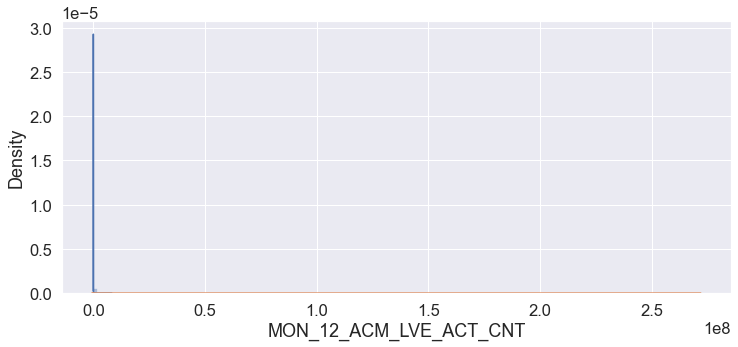

In [1123]:
# import matplotlib.gridspec as gridspec
plt.figure(figsize=(12,5))
sns.distplot(df1['MON_12_ACM_LVE_ACT_CNT'][df1.LABEL == 1], bins=5)
sns.distplot(df1['MON_12_ACM_LVE_ACT_CNT'][df1.LABEL == 0], bins=5)
ax.set_xlabel('')
ax.set_title('histogram of feature: ' + str('MON_12_ACM_LVE_ACT_CNT'))
plt.show()

In [1124]:
# df1.drop(columns = 'MON_12_ACM_LVE_ACT_CNT', inplace = True) # 个人感觉
# df2.drop(columns = 'MON_12_ACM_LVE_ACT_CNT', inplace = True)

In [1125]:
df1['MON_6_50_UP_ENTR_ACT_CNT']

0        192.0
1        132.0
2         72.0
3         22.0
4         52.0
         ...  
39995     12.0
39996     92.0
39997    882.0
39998     52.0
39999    252.0
Name: MON_6_50_UP_ENTR_ACT_CNT, Length: 40000, dtype: float64

- MON_6_50_UP_LVE_ACT_CNT - MON_6_50_UP_ENTR_ACT_CNT 计算净流出（相对变量）

In [1126]:
df1['MON_6_50_UP_NET_ACT_CNT'] = df1['MON_6_50_UP_LVE_ACT_CNT'] - df1['MON_6_50_UP_ENTR_ACT_CNT']

In [1127]:
df2['MON_6_50_UP_NET_ACT_CNT'] = df2['MON_6_50_UP_LVE_ACT_CNT'] - df2['MON_6_50_UP_ENTR_ACT_CNT']

In [1128]:
df1.drop(columns = 'MON_6_50_UP_LVE_ACT_CNT', inplace = True) 
df2.drop(columns = 'MON_6_50_UP_LVE_ACT_CNT', inplace = True)

In [1129]:
quantitive.remove('MON_6_50_UP_LVE_ACT_CNT')

In [1130]:
df1.drop(columns = 'MON_6_50_UP_ENTR_ACT_CNT', inplace = True) 
df2.drop(columns = 'MON_6_50_UP_ENTR_ACT_CNT', inplace = True)
quantitive.remove('MON_6_50_UP_ENTR_ACT_CNT')

- 同理： MON_12_EXT_SAM_TRSF_IN_AMT - MON_12_EXT_SAM_TRSF_OUT_AMT

In [1131]:
df1['MON_12_EXR_SAM_NET_AMT'] = abs(df1['MON_12_EXT_SAM_TRSF_IN_AMT'] - df1['MON_12_EXT_SAM_TRSF_OUT_AMT'])

In [1132]:
df2['MON_12_EXR_SAM_NET_AMT'] = abs(df2['MON_12_EXT_SAM_TRSF_IN_AMT'] - df2['MON_12_EXT_SAM_TRSF_OUT_AMT'])

In [1133]:
df1.drop(columns = 'MON_12_EXT_SAM_TRSF_IN_AMT', inplace = True) 
df2.drop(columns = 'MON_12_EXT_SAM_TRSF_IN_AMT', inplace = True)
quantitive.remove('MON_12_EXT_SAM_TRSF_IN_AMT')

In [1134]:
df1.drop(columns = 'MON_12_EXT_SAM_TRSF_OUT_AMT', inplace = True) 
df2.drop(columns = 'MON_12_EXT_SAM_TRSF_OUT_AMT', inplace = True)
quantitive.remove('MON_12_EXT_SAM_TRSF_OUT_AMT')

- LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV 保留 和 MON_6_50_UP_NET_ACT_CNT 有参考性，认为线性相关

In [1135]:
#EMP_NUM = EMPLOYEE_NUMBER
df1.drop(columns = 'EMP_NBR', inplace = True) 
df2.drop(columns = 'EMP_NBR', inplace = True)
quantitive.remove('EMP_NBR')

In [1136]:
# LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV  CUR_YEAR_MID_BUS_INC
df1.columns

Index(['LABEL', 'AGN_CNT_RCT_12_MON', 'ICO_CUR_MON_ACM_TRX_TM',
       'NB_RCT_3_MON_LGN_TMS_AGV', 'AGN_CUR_YEAR_AMT', 'AGN_CUR_YEAR_WAG_AMT',
       'AGN_AGR_LATEST_AGN_AMT', 'ICO_CUR_MON_ACM_TRX_AMT',
       'COUNTER_CUR_YEAR_CNT_AMT', 'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
       'MON_12_EXT_SAM_NM_TRSF_OUT_CNT', 'MON_12_EXT_SAM_AMT',
       'CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT', 'CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT',
       'MON_12_TRX_AMT_MAX_AMT_PCTT', 'MON_12_ACM_ENTR_ACT_CNT',
       'MON_12_ACM_LVE_ACT_CNT', 'MON_12_AGV_LVE_ACT_CNT',
       'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT', 'CUR_YEAR_COUNTER_ENCASH_CNT',
       'MON_12_ACT_OUT_50_UP_CNT_PTY_QTY', 'MON_12_ACT_IN_50_UP_CNT_PTY_QTY',
       'LAST_12_MON_COR_DPS_TM_PNT_BAL_PEAK_VAL',
       'LAST_12_MON_COR_DPS_DAY_AVG_BAL', 'CUR_MON_COR_DPS_MON_DAY_AVG_BAL',
       'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
       'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
       'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
       'LAST_12_MON_MON_AVG_TRX_AMT_NAV', 'COR_K

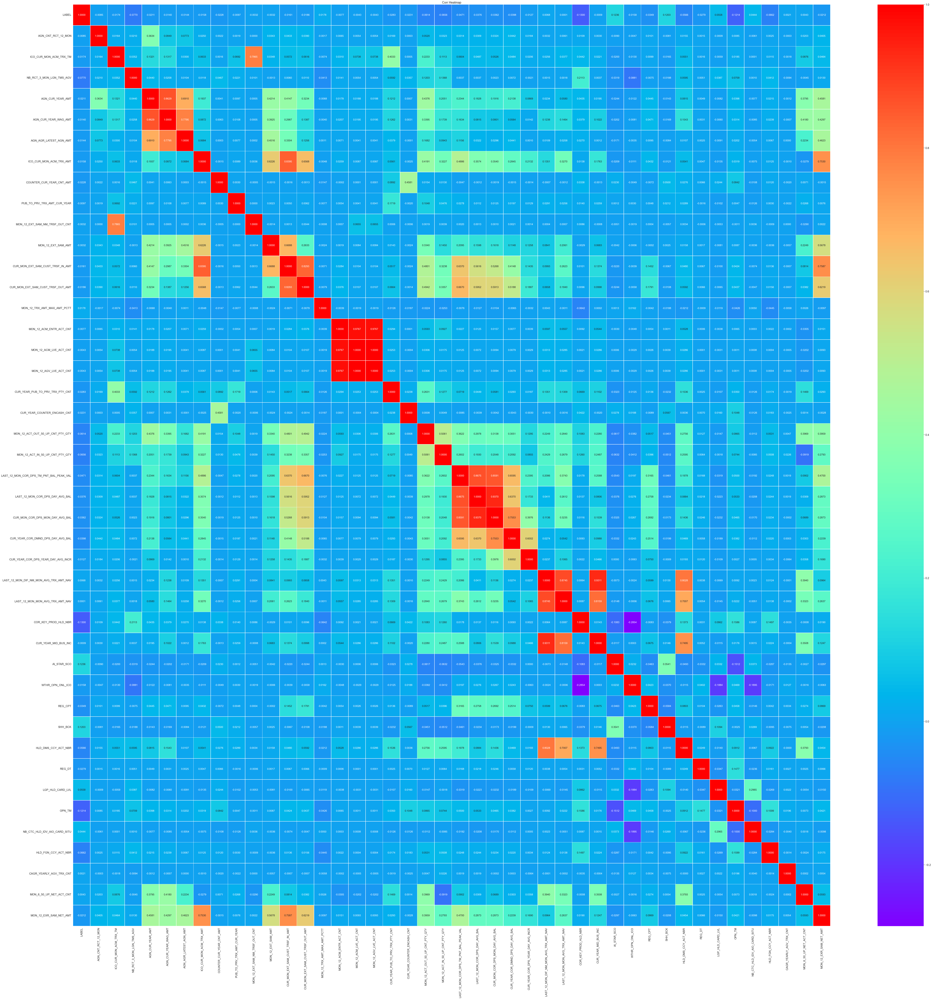

In [1137]:
import seaborn as sns
corr = df1.corr()
plt.figure(figsize=(100,100))
sns.set(font_scale=1.5)
ax=sns.heatmap(corr,
               xticklabels=corr.columns,
               yticklabels=corr.columns,
               linewidths=0.6,annot=True,
               cbar=True,cmap="rainbow",fmt='.4f',
               annot_kws={'size': 15})
plt.title("Corr Heatmap")
plt.savefig("Corr Heatmap.png")
plt.show()

- LAST_12_MON_COR_DPS_TM_PNT_BAL_PEAK_VAL
- LAST_12_MON_COR_DPS_DAY_AVG_BAL

In [1138]:
df1['LAST_12_MON_COR_DPS_DAY_GAP'] = df1['LAST_12_MON_COR_DPS_TM_PNT_BAL_PEAK_VAL'] - df1['LAST_12_MON_COR_DPS_DAY_AVG_BAL']
df2['LAST_12_MON_COR_DPS_DAY_GAP'] = df2['LAST_12_MON_COR_DPS_TM_PNT_BAL_PEAK_VAL'] - df2['LAST_12_MON_COR_DPS_DAY_AVG_BAL']

In [1139]:
df1.drop(columns = 'LAST_12_MON_COR_DPS_TM_PNT_BAL_PEAK_VAL', inplace = True) 
df2.drop(columns = 'LAST_12_MON_COR_DPS_TM_PNT_BAL_PEAK_VAL', inplace = True)
quantitive.remove('LAST_12_MON_COR_DPS_TM_PNT_BAL_PEAK_VAL')

In [1140]:
df1.drop(columns = 'LAST_12_MON_COR_DPS_DAY_AVG_BAL', inplace = True) 
df2.drop(columns = 'LAST_12_MON_COR_DPS_DAY_AVG_BAL', inplace = True)
quantitive.remove('LAST_12_MON_COR_DPS_DAY_AVG_BAL')

- 'CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT'
- 'CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT'

In [1141]:
df1['CUR_MON_EXT_SAM_CUST_TRSF_NET_AMT'] = df1['CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT'] - df1['CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT']
df2['CUR_MON_EXT_SAM_CUST_TRSF_NET_AMT'] = df2['CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT'] - df2['CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT']

In [1142]:
df1.drop(columns = 'CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT', inplace = True) 
df2.drop(columns = 'CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT', inplace = True)
quantitive.remove('CUR_MON_EXT_SAM_CUST_TRSF_IN_AMT')

In [1143]:
df1.drop(columns = 'CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT', inplace = True) 
df2.drop(columns = 'CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT', inplace = True)
quantitive.remove('CUR_MON_EXT_SAM_CUST_TRSF_OUT_AMT')

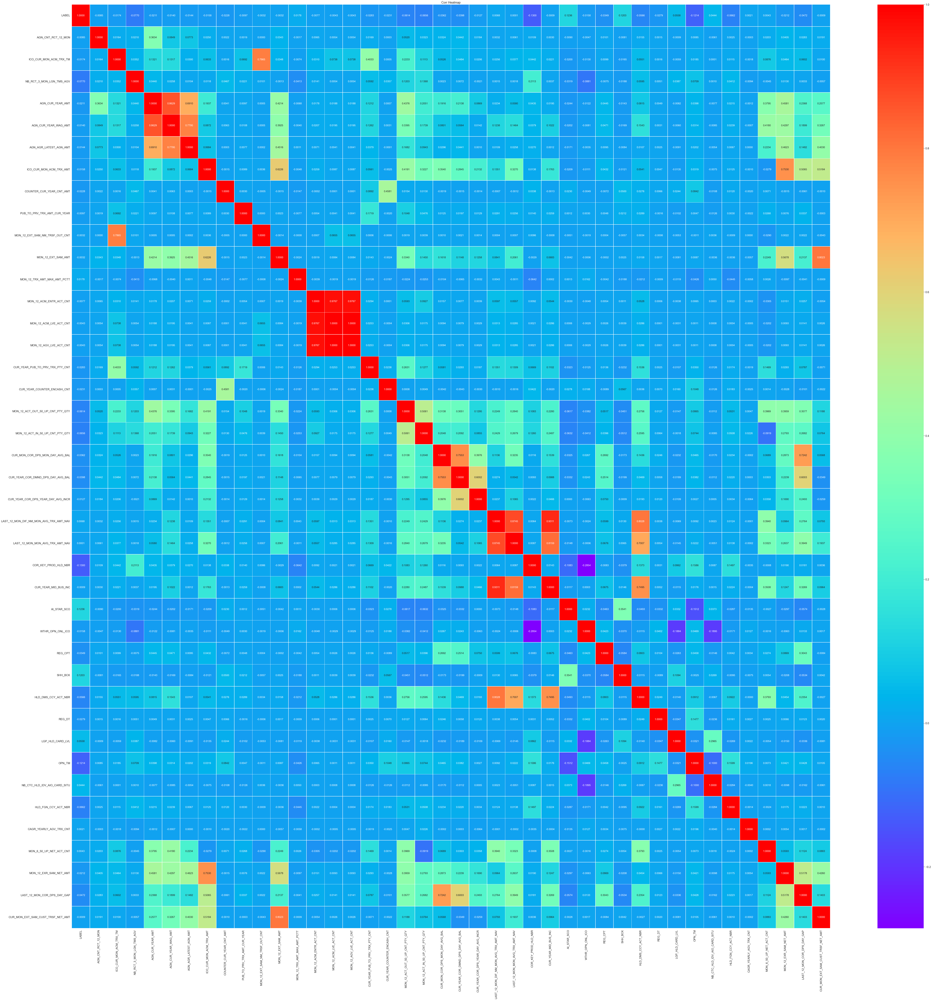

In [1144]:
import seaborn as sns
corr = df1.corr()
plt.figure(figsize=(100,100))
sns.set(font_scale=1.5)
ax=sns.heatmap(corr,
               xticklabels=corr.columns,
               yticklabels=corr.columns,
               linewidths=0.6,annot=True,
               cbar=True,cmap="rainbow",fmt='.4f',
               annot_kws={'size': 15})
plt.title("Corr Heatmap")
# plt.savefig("Corr Heatmap.png")
plt.show()

In [1145]:
df1.columns

Index(['LABEL', 'AGN_CNT_RCT_12_MON', 'ICO_CUR_MON_ACM_TRX_TM',
       'NB_RCT_3_MON_LGN_TMS_AGV', 'AGN_CUR_YEAR_AMT', 'AGN_CUR_YEAR_WAG_AMT',
       'AGN_AGR_LATEST_AGN_AMT', 'ICO_CUR_MON_ACM_TRX_AMT',
       'COUNTER_CUR_YEAR_CNT_AMT', 'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
       'MON_12_EXT_SAM_NM_TRSF_OUT_CNT', 'MON_12_EXT_SAM_AMT',
       'MON_12_TRX_AMT_MAX_AMT_PCTT', 'MON_12_ACM_ENTR_ACT_CNT',
       'MON_12_ACM_LVE_ACT_CNT', 'MON_12_AGV_LVE_ACT_CNT',
       'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT', 'CUR_YEAR_COUNTER_ENCASH_CNT',
       'MON_12_ACT_OUT_50_UP_CNT_PTY_QTY', 'MON_12_ACT_IN_50_UP_CNT_PTY_QTY',
       'CUR_MON_COR_DPS_MON_DAY_AVG_BAL', 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
       'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
       'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
       'LAST_12_MON_MON_AVG_TRX_AMT_NAV', 'COR_KEY_PROD_HLD_NBR',
       'CUR_YEAR_MID_BUS_INC', 'AI_STAR_SCO', 'WTHR_OPN_ONL_ICO', 'REG_CPT',
       'SHH_BCK', 'HLD_DMS_CCY_ACT_NBR', 'REG_DT', 'LGP_HLD_CARD_LVL',
      

- COUNTER_CUR_YEAR_CNT_AMT
- CUR_YEAR_COUNTER_ENCASH_CNT

In [1146]:
df1['ENCASH_CNTR_RATIO'] = df1['CUR_YEAR_COUNTER_ENCASH_CNT'] / df1['COUNTER_CUR_YEAR_CNT_AMT']
df2['ENCASH_CNTR_RATIO'] = df2['CUR_YEAR_COUNTER_ENCASH_CNT'] / df2['COUNTER_CUR_YEAR_CNT_AMT']

In [1147]:
df1.drop(columns = 'CUR_YEAR_COUNTER_ENCASH_CNT', inplace = True) 
df2.drop(columns = 'CUR_YEAR_COUNTER_ENCASH_CNT', inplace = True)
quantitive.remove('CUR_YEAR_COUNTER_ENCASH_CNT')

In [1148]:
df1.drop(columns = 'COUNTER_CUR_YEAR_CNT_AMT', inplace = True) 
df2.drop(columns = 'COUNTER_CUR_YEAR_CNT_AMT', inplace = True)
quantitive.remove('COUNTER_CUR_YEAR_CNT_AMT')

In [1149]:
df1.columns

Index(['LABEL', 'AGN_CNT_RCT_12_MON', 'ICO_CUR_MON_ACM_TRX_TM',
       'NB_RCT_3_MON_LGN_TMS_AGV', 'AGN_CUR_YEAR_AMT', 'AGN_CUR_YEAR_WAG_AMT',
       'AGN_AGR_LATEST_AGN_AMT', 'ICO_CUR_MON_ACM_TRX_AMT',
       'PUB_TO_PRV_TRX_AMT_CUR_YEAR', 'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
       'MON_12_EXT_SAM_AMT', 'MON_12_TRX_AMT_MAX_AMT_PCTT',
       'MON_12_ACM_ENTR_ACT_CNT', 'MON_12_ACM_LVE_ACT_CNT',
       'MON_12_AGV_LVE_ACT_CNT', 'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
       'MON_12_ACT_OUT_50_UP_CNT_PTY_QTY', 'MON_12_ACT_IN_50_UP_CNT_PTY_QTY',
       'CUR_MON_COR_DPS_MON_DAY_AVG_BAL', 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
       'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
       'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
       'LAST_12_MON_MON_AVG_TRX_AMT_NAV', 'COR_KEY_PROD_HLD_NBR',
       'CUR_YEAR_MID_BUS_INC', 'AI_STAR_SCO', 'WTHR_OPN_ONL_ICO', 'REG_CPT',
       'SHH_BCK', 'HLD_DMS_CCY_ACT_NBR', 'REG_DT', 'LGP_HLD_CARD_LVL',
       'OPN_TM', 'NB_CTC_HLD_IDV_AIO_CARD_SITU', 'HLD_FGN_CCY_ACT_NBR',


In [1150]:
df1['COR_KEY_PROD_HLD_NBR'].describe()

count    40000.000000
mean        38.203750
std         15.253092
min         12.000000
25%         32.000000
50%         32.000000
75%         42.000000
max        102.000000
Name: COR_KEY_PROD_HLD_NBR, dtype: float64

D:\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


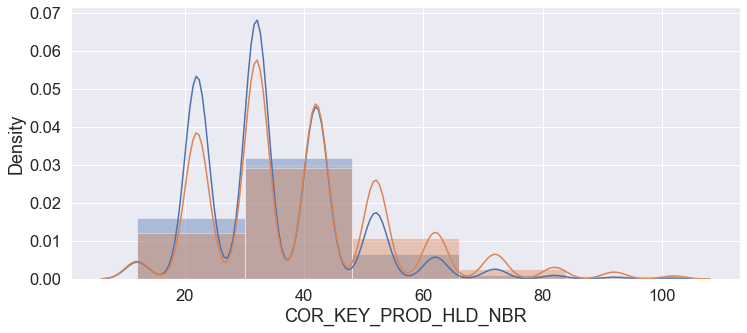

In [1151]:
# import matplotlib.gridspec as gridspec
plt.figure(figsize=(12,5))
sns.distplot(df1['COR_KEY_PROD_HLD_NBR'][df1.LABEL == 1], bins=5)
sns.distplot(df1['COR_KEY_PROD_HLD_NBR'][df1.LABEL == 0], bins=5)
ax.set_xlabel('')
ax.set_title('histogram of feature: ' + str('COR_KEY_PROD_HLD_NBR'))
plt.show()

D:\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
D:\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipp

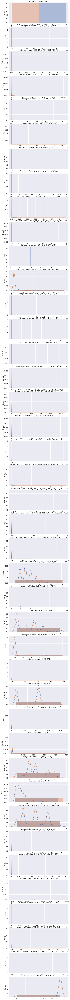

In [1152]:
import matplotlib.gridspec as gridspec
plt.figure(figsize=(12,45*5))
gs = gridspec.GridSpec(45, 1)
for i, cn in enumerate(df1[list(df1.columns)][1:]):
    ax = plt.subplot(gs[i])
    sns.distplot(df1[cn][df1.LABEL == 1], bins=1)
    sns.distplot(df1[cn][df1.LABEL == 0], bins=1)
    ax.set_xlabel('')
    ax.set_title('histogram of feature: ' + str(cn))
plt.show()

In [1153]:
# 'MON_12_ACT_OUT_50_UP_CNT_PTY_QTY',
# 'MON_12_ACT_IN_50_UP_CNT_PTY_QTY'
df1['MON_12_ACT_NET_50_UP_CNT_PTY_QTY'] = df1['MON_12_ACT_OUT_50_UP_CNT_PTY_QTY'] - df1['MON_12_ACT_IN_50_UP_CNT_PTY_QTY']
df2['MON_12_ACT_NET_50_UP_CNT_PTY_QTY'] = df2['MON_12_ACT_OUT_50_UP_CNT_PTY_QTY'] - df2['MON_12_ACT_IN_50_UP_CNT_PTY_QTY']

In [1154]:
df1.drop(columns = 'MON_12_ACT_OUT_50_UP_CNT_PTY_QTY', inplace = True) 
df2.drop(columns = 'MON_12_ACT_OUT_50_UP_CNT_PTY_QTY', inplace = True)

In [1155]:
df1.drop(columns = 'MON_12_ACT_IN_50_UP_CNT_PTY_QTY', inplace = True) 
df2.drop(columns = 'MON_12_ACT_IN_50_UP_CNT_PTY_QTY', inplace = True)

In [1156]:
quantitive.remove('MON_12_ACT_OUT_50_UP_CNT_PTY_QTY')

In [1157]:
quantitive.remove('MON_12_ACT_IN_50_UP_CNT_PTY_QTY')

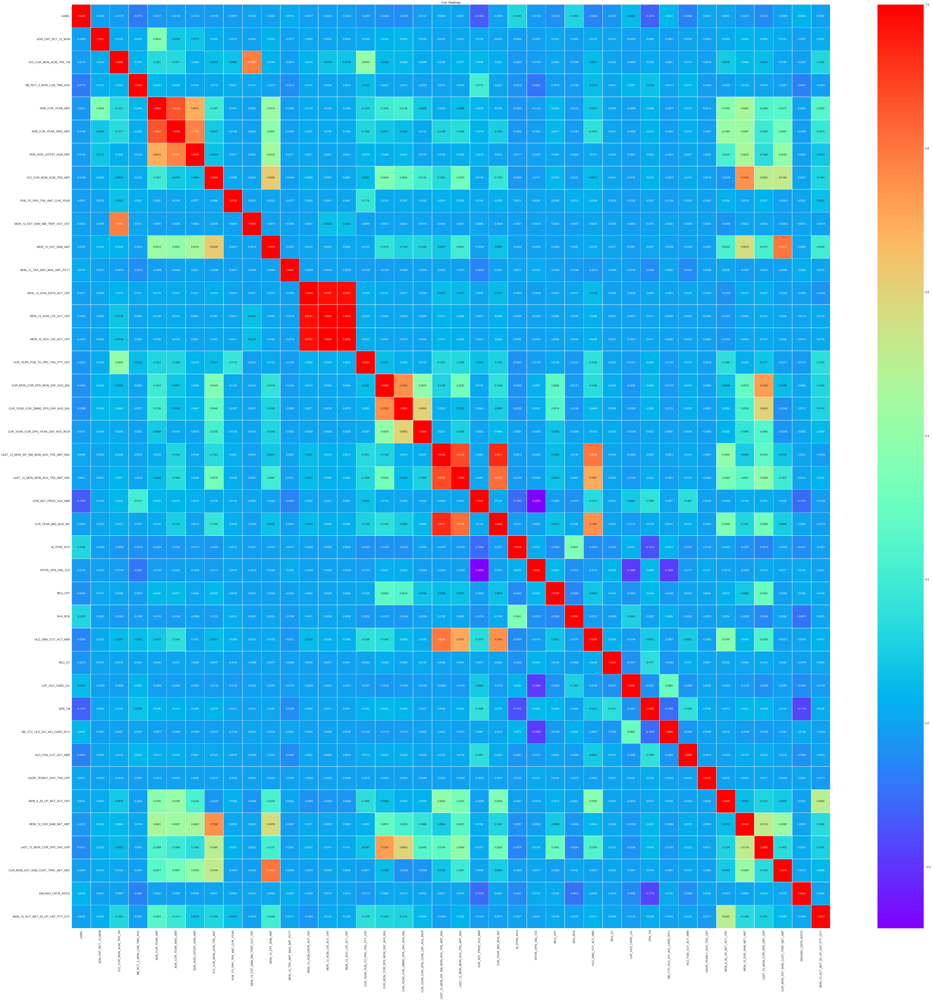

In [1158]:
import seaborn as sns
corr = df1.corr()
plt.figure(figsize=(100,100))
sns.set(font_scale=1.5)
ax=sns.heatmap(corr,
               xticklabels=corr.columns,
               yticklabels=corr.columns,
               linewidths=0.6,annot=True,
               cbar=True,cmap="rainbow",fmt='.4f',
               annot_kws={'size': 15})
plt.title("Corr Heatmap")
plt.savefig("Corr Heatmap.png")
plt.show()

In [1159]:
quanlitive

['AI_STAR_SCO',
 'WTHR_OPN_ONL_ICO',
 'SHH_BCK',
 'LGP_HLD_CARD_LVL',
 'NB_CTC_HLD_IDV_AIO_CARD_SITU']

In [1160]:
df1= df1.apply(pd.to_numeric)
df2= df2.apply(pd.to_numeric)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   LABEL                                   40000 non-null  int64  
 1   AGN_CNT_RCT_12_MON                      40000 non-null  float64
 2   ICO_CUR_MON_ACM_TRX_TM                  40000 non-null  float64
 3   NB_RCT_3_MON_LGN_TMS_AGV                40000 non-null  float64
 4   AGN_CUR_YEAR_AMT                        40000 non-null  float64
 5   AGN_CUR_YEAR_WAG_AMT                    40000 non-null  float64
 6   AGN_AGR_LATEST_AGN_AMT                  40000 non-null  float64
 7   ICO_CUR_MON_ACM_TRX_AMT                 40000 non-null  float64
 8   PUB_TO_PRV_TRX_AMT_CUR_YEAR             40000 non-null  float64
 9   MON_12_EXT_SAM_NM_TRSF_OUT_CNT          40000 non-null  float64
 10  MON_12_EXT_SAM_AMT                      40000 non-null  fl

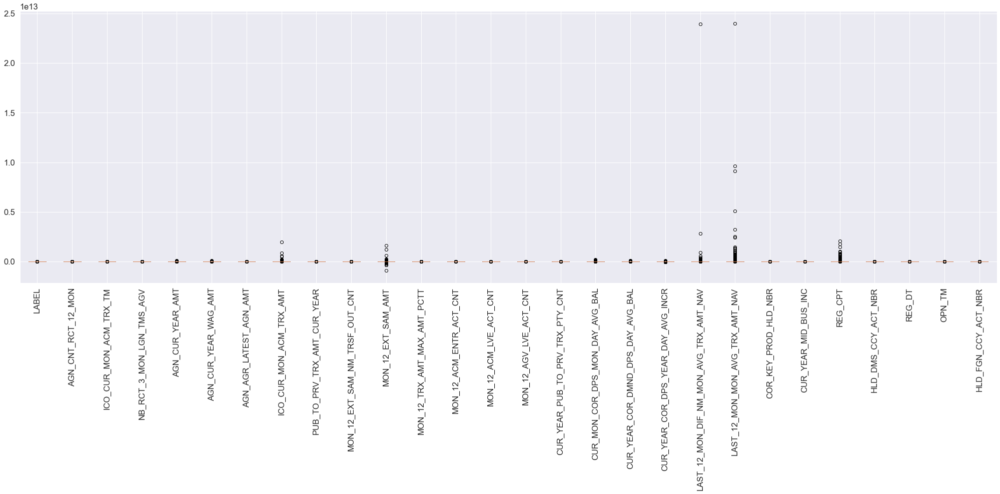

In [1161]:
plt.figure(figsize=(35,10))
plt.boxplot(x=df1[quantitive].values,labels=quantitive,whis=1.5) #columns列索引，values所有数值
plt.xticks(rotation = 90)
plt.show()


In [1162]:
df1.columns

Index(['LABEL', 'AGN_CNT_RCT_12_MON', 'ICO_CUR_MON_ACM_TRX_TM',
       'NB_RCT_3_MON_LGN_TMS_AGV', 'AGN_CUR_YEAR_AMT', 'AGN_CUR_YEAR_WAG_AMT',
       'AGN_AGR_LATEST_AGN_AMT', 'ICO_CUR_MON_ACM_TRX_AMT',
       'PUB_TO_PRV_TRX_AMT_CUR_YEAR', 'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
       'MON_12_EXT_SAM_AMT', 'MON_12_TRX_AMT_MAX_AMT_PCTT',
       'MON_12_ACM_ENTR_ACT_CNT', 'MON_12_ACM_LVE_ACT_CNT',
       'MON_12_AGV_LVE_ACT_CNT', 'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
       'CUR_MON_COR_DPS_MON_DAY_AVG_BAL', 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
       'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
       'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
       'LAST_12_MON_MON_AVG_TRX_AMT_NAV', 'COR_KEY_PROD_HLD_NBR',
       'CUR_YEAR_MID_BUS_INC', 'AI_STAR_SCO', 'WTHR_OPN_ONL_ICO', 'REG_CPT',
       'SHH_BCK', 'HLD_DMS_CCY_ACT_NBR', 'REG_DT', 'LGP_HLD_CARD_LVL',
       'OPN_TM', 'NB_CTC_HLD_IDV_AIO_CARD_SITU', 'HLD_FGN_CCY_ACT_NBR',
       'CAGR_YEARLY_AGV_TRX_CNT', 'MON_6_50_UP_NET_ACT_CNT',
       'MON_12_EX

In [ ]:
df1[quantitive].describe().T
df1.isnull().sum()

In [1164]:
quantitive.remove('LABEL')

In [1165]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler2= MinMaxScaler(feature_range=(0, 1))  # 默认(0,1)
df1[quantitive]= scaler2.fit_transform(df1[quantitive])

In [1166]:
df2[quantitive] = scaler2.fit_transform(df2[quantitive])
df2.head()

,AGN_CNT_RCT_12_MON,ICO_CUR_MON_ACM_TRX_TM,NB_RCT_3_MON_LGN_TMS_AGV,AGN_CUR_YEAR_AMT,AGN_CUR_YEAR_WAG_AMT,AGN_AGR_LATEST_AGN_AMT,ICO_CUR_MON_ACM_TRX_AMT,PUB_TO_PRV_TRX_AMT_CUR_YEAR,MON_12_EXT_SAM_NM_TRSF_OUT_CNT,MON_12_EXT_SAM_AMT,...,OPN_TM,NB_CTC_HLD_IDV_AIO_CARD_SITU,HLD_FGN_CCY_ACT_NBR,CAGR_YEARLY_AGV_TRX_CNT,MON_6_50_UP_NET_ACT_CNT,MON_12_EXR_SAM_NET_AMT,LAST_12_MON_COR_DPS_DAY_GAP,CUR_MON_EXT_SAM_CUST_TRSF_NET_AMT,ENCASH_CNTR_RATIO,MON_12_ACT_NET_50_UP_CNT_PTY_QTY
0,0.002303,0.000530,0.006660,0.000469,0.000406,0.000034,0.000058,0.000000,0.000715,0.321176,...,0.447839,0,0.00,0.182482,0.0,394825000.0,293772162.9,300000000.0,1.0,0.0
1,0.000242,0.000000,0.006660,0.000469,0.000406,0.000178,0.000000,0.000000,0.001430,0.319481,...,0.022251,0,0.00,-0.155340,-10.0,51000000.0,34964537.2,0.0,1.0,-30.0
2,0.000163,0.000000,0.001829,0.000039,0.000406,0.000251,0.000000,0.000000,0.000000,0.319675,...,0.143809,1,0.02,-0.093484,-20.0,0.0,17900582.1,0.0,1.0,-20.0
3,0.000528,0.000589,0.003396,0.001857,0.002172,0.001863,0.000050,0.000248,0.000000,0.319675,...,0.121009,1,0.00,-0.165476,-50.0,0.0,13202520.8,0.0,1.0,0.0
4,0.001152,0.004592,0.060458,0.001076,0.000406,0.000034,0.000503,0.000279,0.000000,0.319675,...,0.903520,1,0.00,0.080836,30.0,0.0,94405131.1,0.0,1.0,90.0


In [1167]:
df1[quantitive]

,AGN_CNT_RCT_12_MON,ICO_CUR_MON_ACM_TRX_TM,NB_RCT_3_MON_LGN_TMS_AGV,AGN_CUR_YEAR_AMT,AGN_CUR_YEAR_WAG_AMT,AGN_AGR_LATEST_AGN_AMT,ICO_CUR_MON_ACM_TRX_AMT,PUB_TO_PRV_TRX_AMT_CUR_YEAR,MON_12_EXT_SAM_NM_TRSF_OUT_CNT,MON_12_EXT_SAM_AMT,...,CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR,LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV,LAST_12_MON_MON_AVG_TRX_AMT_NAV,COR_KEY_PROD_HLD_NBR,CUR_YEAR_MID_BUS_INC,REG_CPT,HLD_DMS_CCY_ACT_NBR,REG_DT,OPN_TM,HLD_FGN_CCY_ACT_NBR
0,0.000017,0.000039,0.004066,0.000093,0.000069,0.000053,1.317001e-05,3.880256e-05,0.000035,0.352344,...,0.339468,5.727455e-06,7.998005e-06,0.111111,0.169269,5.844792e-04,0.001143,0.007028,0.113297,0.0
1,0.000016,0.000123,0.001665,0.000091,0.000069,0.000155,7.508892e-06,7.435183e-06,0.000000,0.352397,...,0.339647,2.616496e-06,3.089652e-06,0.666667,0.169267,2.435330e-06,0.002286,0.000804,0.052901,0.0
2,0.000017,0.000000,0.001665,0.000093,0.000069,0.000362,0.000000e+00,0.000000e+00,0.000000,0.352397,...,0.339604,5.856032e-07,5.838003e-07,0.222222,0.169267,4.870660e-05,0.001143,0.004665,0.306031,0.0
3,0.000017,0.000050,0.000192,0.000093,0.000069,0.000053,4.897001e-06,0.000000e+00,0.000000,0.352397,...,0.339627,3.075338e-07,3.065870e-07,0.111111,0.169267,2.435329e-07,0.001143,0.000387,0.024511,0.0
4,0.000017,0.000050,0.001665,0.000093,0.000069,0.000053,4.897001e-06,1.644350e-07,0.000000,0.352397,...,0.339603,1.109341e-06,1.578412e-06,0.000000,0.169267,4.870660e-05,0.001143,0.002880,0.096632,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,0.000017,0.000000,0.000512,0.000093,0.000069,0.000053,0.000000e+00,0.000000e+00,0.000000,0.352402,...,0.339647,1.227965e-06,1.476265e-06,0.111111,0.169267,1.461198e-04,0.002286,0.000824,0.034914,0.0
39996,0.000017,0.000039,0.001376,0.000093,0.000069,0.000053,8.361766e-06,0.000000e+00,0.000000,0.352397,...,0.339664,9.875344e-07,9.844940e-07,0.111111,0.169267,2.435330e-04,0.001143,0.000709,0.043291,0.0
39997,0.000151,0.000629,0.001665,0.000628,0.000069,0.001004,3.034266e-04,2.847469e-05,0.000051,0.352261,...,0.339543,1.393132e-05,2.789468e-05,0.333333,0.169280,2.435330e-04,0.001143,0.009325,0.582263,0.0
39998,0.000017,0.000006,0.001217,0.000093,0.000069,0.000053,2.485917e-07,0.000000e+00,0.000000,0.352397,...,0.339605,1.403112e-07,1.398792e-07,0.111111,0.169267,4.870660e-06,0.001143,0.002111,0.138776,0.0


In [1168]:
df1['LABEL']

0        0
1        0
2        0
3        1
4        1
        ..
39995    0
39996    0
39997    0
39998    1
39999    0
Name: LABEL, Length: 40000, dtype: int64

In [479]:
# 载入包
from autogluon.tabular import TabularDataset, TabularPredictor
# 载入训练数据
train_data = df1.iloc[:30000,:]
# 建模
time_limit = 180  # 这里设置 60 秒仅用于快速演示代码，在实际中应该设置为你愿意等待的最长时间（以秒为单位）
metric = 'roc_auc'  # 指定模型性能指标，这里为 AUC
predictor = TabularPredictor('LABEL', eval_metric=metric).fit(train_data, time_limit=time_limit, presets='best_quality')
# 载入测试数据
test_data = df1.iloc[30000:,:]
# 查看模型性能排名
leaderboard = predictor.leaderboard(test_data, silent = True)

No path specified. Models will be saved in: "AutogluonModels/ag-20220508_052014\"
Presets specified: ['best_quality']
Beginning AutoGluon training ... Time limit = 180s
AutoGluon will save models to "AutogluonModels/ag-20220508_052014\"
AutoGluon Version:  0.4.0
Python Version:     3.9.7
Operating System:   Windows
Train Data Rows:    30000
Train Data Columns: 38
Label Column: LABEL
Preprocessing data ...
AutoGluon infers your prediction problem is: 'binary' (because only two unique label-values observed).
	2 unique label values:  [0, 1]
	If 'binary' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Selected class <--> label mapping:  class 1 = 1, class 0 = 0
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    4599.46 MB
	Train Data (Original)  Memory Usage: 9.12 MB (0.2% 

In [480]:
leaderboard

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMXT_BAG_L2,0.949719,0.947173,3.036949,7.169932,84.405448,0.168998,0.433288,6.139822,2,True,11
1,WeightedEnsemble_L3,0.949447,0.947353,3.396355,8.458640,99.946240,0.001996,0.006391,1.839159,3,True,14
2,LightGBM_BAG_L2,0.949400,0.946087,2.992950,7.022648,84.341629,0.124999,0.286004,6.076003,2,True,12
3,LightGBM_BAG_L1,0.948882,0.945966,0.231999,0.526520,6.109266,0.231999,0.526520,6.109266,1,True,4
4,WeightedEnsemble_L2,0.948811,0.947531,1.875785,3.665600,79.789111,0.003000,0.006377,5.260370,2,True,10
5,LightGBMXT_BAG_L1,0.948113,0.945872,1.093954,1.209802,8.323213,1.093954,1.209802,8.323213,1,True,3
6,CatBoost_BAG_L1,0.947981,0.945606,0.077739,0.074270,49.114097,0.077739,0.074270,49.114097,1,True,7
7,RandomForestGini_BAG_L2,0.945594,0.944228,3.100362,7.732958,85.891256,0.232411,0.996313,7.625629,2,True,13
8,RandomForestEntr_BAG_L1,0.943543,0.942846,0.244070,0.904699,6.436867,0.244070,0.904699,6.436867,1,True,6
9,RandomForestGini_BAG_L1,0.941597,0.941767,0.225022,0.943931,4.545298,0.225022,0.943931,4.545298,1,True,5


In [482]:
df2.shape
df1.shape

(37237, 39)

In [483]:
predict_proba = predictor.predict_proba(df2)
predict_proba

,0,1
0,0.877272,0.122728
1,0.546000,0.454000
2,0.832637,0.167363
3,0.463027,0.536973
4,0.698415,0.301585
...,...,...
11995,0.893090,0.106910
11996,0.776610,0.223390
11997,0.437978,0.562022
11998,0.576522,0.423478


In [484]:
predict_proba.iloc[:,1:].values.reshape(-1)

array([0.12272841, 0.45399991, 0.16736287, ..., 0.56202233, 0.42347836,
       0.48271254])

In [485]:
pd.DataFrame(predict_proba.iloc[:,1:].values.reshape(-1)).to_csv('Sample Submission v13.csv')

In [486]:
# df1[quanlitive] = pd.get_dummies(df1[quanlitive])
# df2[quanlitive] = pd.get_dummies(df2[quanlitive])

In [564]:
#构建X特征变量和Y目标变量
x_feature = list(df1.columns)
x_feature.remove('LABEL')
x_val = df1[cols]
y_val = df1['LABEL']
len(x_val) # 查看初始特征集合的数量

37237

In [496]:
x_val.describe().T # 初览数据

,count,mean,std,min,25%,50%,75%,max
AGN_CNT_RCT_12_MON,37237.0,-0.995360,0.026620,-1.0,-0.998331,-0.998331,-0.998331,1.0
ICO_CUR_MON_ACM_TRX_TM,37237.0,-0.990263,0.032485,-1.0,-0.999275,-0.996737,-0.991662,1.0
NB_RCT_3_MON_LGN_TMS_AGV,37237.0,-0.920252,0.097293,-1.0,-0.980421,-0.949129,-0.900195,1.0
AGN_CUR_YEAR_AMT,37232.0,-0.988193,0.047932,-1.0,-0.995112,-0.995112,-0.995112,1.0
AGN_CUR_YEAR_WAG_AMT,37237.0,-0.991050,0.041744,-1.0,-0.995487,-0.995487,-0.995487,1.0
AGN_AGR_LATEST_AGN_AMT,37237.0,-0.998248,0.016714,-1.0,-0.999495,-0.999487,-0.999487,1.0
ICO_CUR_MON_ACM_TRX_AMT,37019.0,-0.964581,0.138609,-1.0,-0.999682,-0.996779,-0.988332,1.0
PUB_TO_PRV_TRX_AMT_CUR_YEAR,37235.0,-0.997418,0.026570,-1.0,-1.000000,-1.000000,-0.999303,1.0
MON_12_EXT_SAM_NM_TRSF_OUT_CNT,37237.0,-0.992560,0.030149,-1.0,-1.000000,-1.000000,-0.994232,1.0
MON_12_EXT_SAM_AMT,36931.0,-0.086169,0.099298,-1.0,-0.090601,-0.090601,-0.090600,1.0


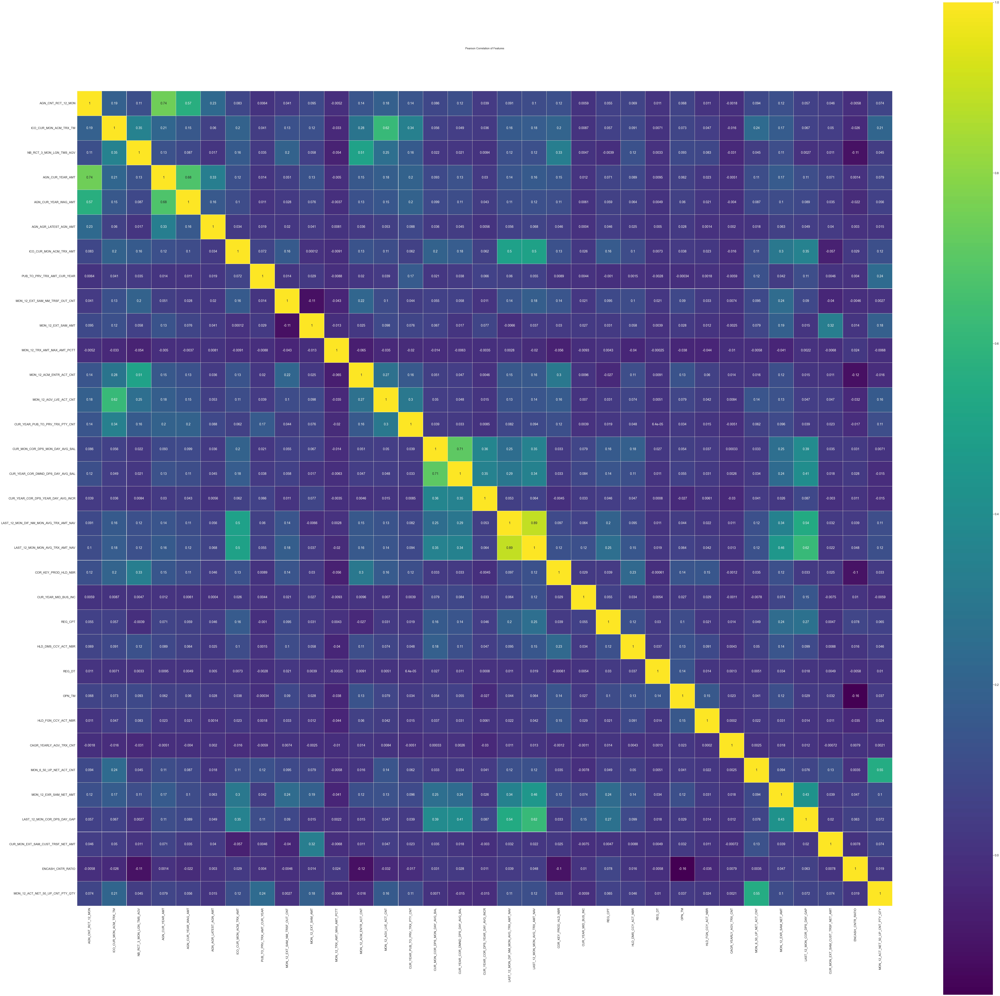

In [508]:
colormap = plt.cm.viridis
plt.figure(figsize=(100,100))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(df1[cols].corr(),linewidths=0.1,vmax=1.0, square=True, cmap=colormap, linecolor='white', annot=True)
plt.savefig('pearson.png')

In [509]:
df1.columns

Index(['AGN_CNT_RCT_12_MON', 'ICO_CUR_MON_ACM_TRX_TM',
       'NB_RCT_3_MON_LGN_TMS_AGV', 'AGN_CUR_YEAR_AMT', 'AGN_CUR_YEAR_WAG_AMT',
       'AGN_AGR_LATEST_AGN_AMT', 'ICO_CUR_MON_ACM_TRX_AMT',
       'PUB_TO_PRV_TRX_AMT_CUR_YEAR', 'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
       'MON_12_EXT_SAM_AMT', 'MON_12_TRX_AMT_MAX_AMT_PCTT',
       'MON_12_ACM_ENTR_ACT_CNT', 'MON_12_AGV_LVE_ACT_CNT',
       'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT', 'CUR_MON_COR_DPS_MON_DAY_AVG_BAL',
       'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
       'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
       'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
       'LAST_12_MON_MON_AVG_TRX_AMT_NAV', 'COR_KEY_PROD_HLD_NBR',
       'CUR_YEAR_MID_BUS_INC', 'AI_STAR_SCO', 'WTHR_OPN_ONL_ICO', 'REG_CPT',
       'SHH_BCK', 'HLD_DMS_CCY_ACT_NBR', 'REG_DT', 'LGP_HLD_CARD_LVL',
       'OPN_TM', 'NB_CTC_HLD_IDV_AIO_CARD_SITU', 'HLD_FGN_CCY_ACT_NBR',
       'CAGR_YEARLY_AGV_TRX_CNT', 'LABEL', 'MON_6_50_UP_NET_ACT_CNT',
       'MON_12_EXR_SAM_NET_AMT', 'LAST_12_M

In [585]:
df1.drop(columns=['AGN_CUR_YEAR_AMT', 'CUR_MON_COR_DPS_MON_DAY_AVG_BAL','LAST_12_MON_MON_AVG_TRX_AMT_NAV'],inplace = True)

KeyError: "['AGN_CUR_YEAR_AMT', 'CUR_MON_COR_DPS_MON_DAY_AVG_BAL', 'LAST_12_MON_MON_AVG_TRX_AMT_NAV'] not found in axis"

In [566]:
df2.drop(columns=['AGN_CUR_YEAR_AMT', 'CUR_MON_COR_DPS_MON_DAY_AVG_BAL','LAST_12_MON_MON_AVG_TRX_AMT_NAV'],inplace = True)

In [587]:
df1.shape, df2.shape

((37237, 36), (12000, 35))

In [588]:
# 载入包
from autogluon.tabular import TabularDataset, TabularPredictor
# 载入训练数据
train_data = df1.iloc[:30000,:]
# 建模
time_limit = 180  # 这里设置 60 秒仅用于快速演示代码，在实际中应该设置为你愿意等待的最长时间（以秒为单位）
metric = 'roc_auc'  # 指定模型性能指标，这里为 AUC
predictor = TabularPredictor('LABEL', eval_metric=metric).fit(train_data, time_limit=time_limit, presets='best_quality')
# 载入测试数据
test_data = df1.iloc[30000:,:]
# 查看模型性能排名
leaderboard = predictor.leaderboard(test_data, silent = True)

No path specified. Models will be saved in: "AutogluonModels/ag-20220508_073537\"
Presets specified: ['best_quality']
Beginning AutoGluon training ... Time limit = 180s
AutoGluon will save models to "AutogluonModels/ag-20220508_073537\"
AutoGluon Version:  0.4.0
Python Version:     3.9.7
Operating System:   Windows
Train Data Rows:    30000
Train Data Columns: 35
Label Column: LABEL
Preprocessing data ...
AutoGluon infers your prediction problem is: 'binary' (because only two unique label-values observed).
	2 unique label values:  [0, 1]
	If 'binary' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Selected class <--> label mapping:  class 1 = 1, class 0 = 0
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    5229.49 MB
	Train Data (Original)  Memory Usage: 8.4 MB (0.2% o

In [480]:
leaderboard

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMXT_BAG_L2,0.949719,0.947173,3.036949,7.169932,84.405448,0.168998,0.433288,6.139822,2,True,11
1,WeightedEnsemble_L3,0.949447,0.947353,3.396355,8.458640,99.946240,0.001996,0.006391,1.839159,3,True,14
2,LightGBM_BAG_L2,0.949400,0.946087,2.992950,7.022648,84.341629,0.124999,0.286004,6.076003,2,True,12
3,LightGBM_BAG_L1,0.948882,0.945966,0.231999,0.526520,6.109266,0.231999,0.526520,6.109266,1,True,4
4,WeightedEnsemble_L2,0.948811,0.947531,1.875785,3.665600,79.789111,0.003000,0.006377,5.260370,2,True,10
5,LightGBMXT_BAG_L1,0.948113,0.945872,1.093954,1.209802,8.323213,1.093954,1.209802,8.323213,1,True,3
6,CatBoost_BAG_L1,0.947981,0.945606,0.077739,0.074270,49.114097,0.077739,0.074270,49.114097,1,True,7
7,RandomForestGini_BAG_L2,0.945594,0.944228,3.100362,7.732958,85.891256,0.232411,0.996313,7.625629,2,True,13
8,RandomForestEntr_BAG_L1,0.943543,0.942846,0.244070,0.904699,6.436867,0.244070,0.904699,6.436867,1,True,6
9,RandomForestGini_BAG_L1,0.941597,0.941767,0.225022,0.943931,4.545298,0.225022,0.943931,4.545298,1,True,5


In [589]:
df2.shape
df1.shape

(37237, 36)

In [590]:
predict_proba = predictor.predict_proba(df2)
predict_proba

,0,1
0,0.829911,0.170089
1,0.701591,0.298408
2,0.633120,0.366880
3,0.667817,0.332184
4,0.700676,0.299324
...,...,...
11995,0.864735,0.135265
11996,0.495962,0.504038
11997,0.771563,0.228437
11998,0.719090,0.280910


In [484]:
predict_proba.iloc[:,1:].values.reshape(-1)

array([0.12272841, 0.45399991, 0.16736287, ..., 0.56202233, 0.42347836,
       0.48271254])

In [591]:
pd.DataFrame(predict_proba.iloc[:,1:].values.reshape(-1)).to_csv('Sample Submission v14.csv')

In [592]:
list(df1.columns)

['AGN_CNT_RCT_12_MON',
 'ICO_CUR_MON_ACM_TRX_TM',
 'NB_RCT_3_MON_LGN_TMS_AGV',
 'AGN_CUR_YEAR_WAG_AMT',
 'AGN_AGR_LATEST_AGN_AMT',
 'ICO_CUR_MON_ACM_TRX_AMT',
 'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
 'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
 'MON_12_EXT_SAM_AMT',
 'MON_12_TRX_AMT_MAX_AMT_PCTT',
 'MON_12_ACM_ENTR_ACT_CNT',
 'MON_12_AGV_LVE_ACT_CNT',
 'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
 'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
 'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
 'COR_KEY_PROD_HLD_NBR',
 'CUR_YEAR_MID_BUS_INC',
 'AI_STAR_SCO',
 'WTHR_OPN_ONL_ICO',
 'REG_CPT',
 'SHH_BCK',
 'HLD_DMS_CCY_ACT_NBR',
 'REG_DT',
 'LGP_HLD_CARD_LVL',
 'OPN_TM',
 'NB_CTC_HLD_IDV_AIO_CARD_SITU',
 'HLD_FGN_CCY_ACT_NBR',
 'CAGR_YEARLY_AGV_TRX_CNT',
 'LABEL',
 'MON_6_50_UP_NET_ACT_CNT',
 'MON_12_EXR_SAM_NET_AMT',
 'LAST_12_MON_COR_DPS_DAY_GAP',
 'CUR_MON_EXT_SAM_CUST_TRSF_NET_AMT',
 'ENCASH_CNTR_RATIO',
 'MON_12_ACT_NET_50_UP_CNT_PTY_QTY']

In [1169]:
df1['LABEL'].value_counts()

0    30000
1    10000
Name: LABEL, dtype: int64

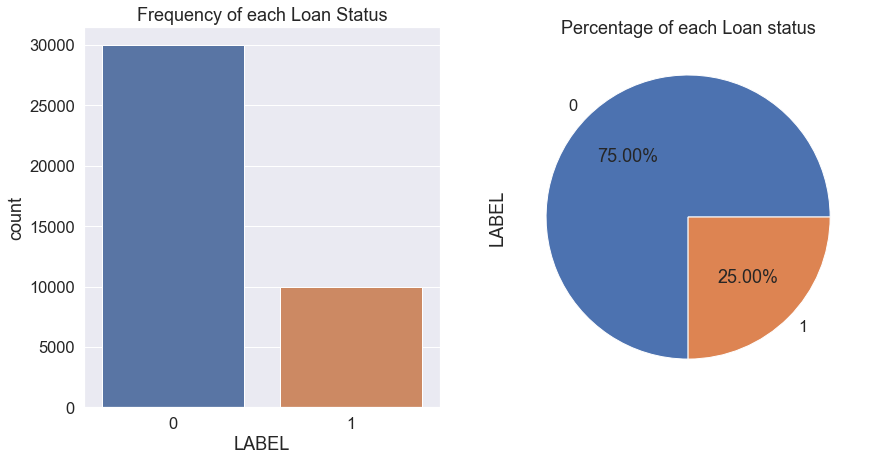

In [1170]:
# 贷款状态分布可视化
fig, axs = plt.subplots(1,2,figsize=(14,7))
sns.countplot(x='LABEL',data=df1,ax=axs[0])
axs[0].set_title("Frequency of each Loan Status")
df1['LABEL'].value_counts().plot(x=None,y=None, kind='pie', ax=axs[1],autopct='%1.2f%%')
axs[1].set_title("Percentage of each Loan status")
plt.show()

In [1171]:
# col = loans.select_dtypes(include=['int64','float64']).columns
# col = col.drop('loan_status') #剔除目标变量
quantitive.remove('AGN_CUR_YEAR_AMT')
quantitive.remove('CUR_MON_COR_DPS_MON_DAY_AVG_BAL')
quantitive.remove('LAST_12_MON_MON_AVG_TRX_AMT_NAV')
len(cols), df1.shape

In [1173]:
quantitive,quanlitive

(['AGN_CNT_RCT_12_MON',
  'ICO_CUR_MON_ACM_TRX_TM',
  'NB_RCT_3_MON_LGN_TMS_AGV',
  'AGN_CUR_YEAR_WAG_AMT',
  'AGN_AGR_LATEST_AGN_AMT',
  'ICO_CUR_MON_ACM_TRX_AMT',
  'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
  'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
  'MON_12_EXT_SAM_AMT',
  'MON_12_TRX_AMT_MAX_AMT_PCTT',
  'MON_12_ACM_ENTR_ACT_CNT',
  'MON_12_ACM_LVE_ACT_CNT',
  'MON_12_AGV_LVE_ACT_CNT',
  'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
  'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
  'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
  'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
  'COR_KEY_PROD_HLD_NBR',
  'CUR_YEAR_MID_BUS_INC',
  'REG_CPT',
  'HLD_DMS_CCY_ACT_NBR',
  'REG_DT',
  'OPN_TM',
  'HLD_FGN_CCY_ACT_NBR'],
 ['AI_STAR_SCO',
  'WTHR_OPN_ONL_ICO',
  'SHH_BCK',
  'LGP_HLD_CARD_LVL',
  'NB_CTC_HLD_IDV_AIO_CARD_SITU'])

In [1175]:
df1.fillna(0.0, inplace =True)
x_feature = df1[['AGN_CNT_RCT_12_MON',
 'ICO_CUR_MON_ACM_TRX_TM',
 'NB_RCT_3_MON_LGN_TMS_AGV',
 'AGN_CUR_YEAR_WAG_AMT',
 'AGN_AGR_LATEST_AGN_AMT',
 'ICO_CUR_MON_ACM_TRX_AMT',
 'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
 'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
 'MON_12_EXT_SAM_AMT',
 'MON_12_TRX_AMT_MAX_AMT_PCTT',
 'MON_12_ACM_ENTR_ACT_CNT',
 'MON_12_ACM_LVE_ACT_CNT',
 'MON_12_AGV_LVE_ACT_CNT',
 'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
 'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
 'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
 'COR_KEY_PROD_HLD_NBR',
 'CUR_YEAR_MID_BUS_INC',
 'REG_CPT',
 'HLD_DMS_CCY_ACT_NBR',
 'REG_DT',
 'OPN_TM',
 'HLD_FGN_CCY_ACT_NBR', 'AI_STAR_SCO',
  'WTHR_OPN_ONL_ICO',
  'SHH_BCK',
  'LGP_HLD_CARD_LVL',
  'NB_CTC_HLD_IDV_AIO_CARD_SITU']] # 复制数据至变量loans_ml_df
x_feature

,AGN_CNT_RCT_12_MON,ICO_CUR_MON_ACM_TRX_TM,NB_RCT_3_MON_LGN_TMS_AGV,AGN_CUR_YEAR_WAG_AMT,AGN_AGR_LATEST_AGN_AMT,ICO_CUR_MON_ACM_TRX_AMT,PUB_TO_PRV_TRX_AMT_CUR_YEAR,MON_12_EXT_SAM_NM_TRSF_OUT_CNT,MON_12_EXT_SAM_AMT,MON_12_TRX_AMT_MAX_AMT_PCTT,...,REG_CPT,HLD_DMS_CCY_ACT_NBR,REG_DT,OPN_TM,HLD_FGN_CCY_ACT_NBR,AI_STAR_SCO,WTHR_OPN_ONL_ICO,SHH_BCK,LGP_HLD_CARD_LVL,NB_CTC_HLD_IDV_AIO_CARD_SITU
0,0.000017,0.000039,0.004066,0.000069,0.000053,1.317001e-05,3.880256e-05,0.000035,0.352344,0.01,...,5.844792e-04,0.001143,0.007028,0.113297,0.0,0,0,0,0,0
1,0.000016,0.000123,0.001665,0.000069,0.000155,7.508892e-06,7.435183e-06,0.000000,0.352397,0.00,...,2.435330e-06,0.002286,0.000804,0.052901,0.0,0,0,0,1,1
2,0.000017,0.000000,0.001665,0.000069,0.000362,0.000000e+00,0.000000e+00,0.000000,0.352397,0.02,...,4.870660e-05,0.001143,0.004665,0.306031,0.0,0,0,1,1,2
3,0.000017,0.000050,0.000192,0.000069,0.000053,4.897001e-06,0.000000e+00,0.000000,0.352397,0.11,...,2.435329e-07,0.001143,0.000387,0.024511,0.0,1,1,2,2,3
4,0.000017,0.000050,0.001665,0.000069,0.000053,4.897001e-06,1.644350e-07,0.000000,0.352397,0.02,...,4.870660e-05,0.001143,0.002880,0.096632,0.0,2,1,1,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,0.000017,0.000000,0.000512,0.000069,0.000053,0.000000e+00,0.000000e+00,0.000000,0.352402,0.02,...,1.461198e-04,0.002286,0.000824,0.034914,0.0,3,0,2,5,5
39996,0.000017,0.000039,0.001376,0.000069,0.000053,8.361766e-06,0.000000e+00,0.000000,0.352397,0.01,...,2.435330e-04,0.001143,0.000709,0.043291,0.0,1,0,2,0,0
39997,0.000151,0.000629,0.001665,0.000069,0.001004,3.034266e-04,2.847469e-05,0.000051,0.352261,0.01,...,2.435330e-04,0.001143,0.009325,0.582263,0.0,0,0,0,3,2
39998,0.000017,0.000006,0.001217,0.000069,0.000053,2.485917e-07,0.000000e+00,0.000000,0.352397,0.02,...,4.870660e-06,0.001143,0.002111,0.138776,0.0,3,0,2,0,0


In [1176]:
x_val = x_feature
y_val = df1['LABEL']
len(x_feature) # 查看初始特征集合的数量
# from sklearn.preprocessing import StandardScaler # 导入模块
# sc =StandardScaler() # 初始化缩放器
# loans_ml_df[cols] =sc.fit_transform(loans_ml_df[cols]) #对数据进行标准化
# loans_ml_df.head() #查看经标准化后的数据

40000

In [1177]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
# 建立逻辑回归分类器
model = LogisticRegression()
model

LogisticRegression()

In [1178]:
# 建立递归特征消除筛选器
rfe = RFE(model) #通过递归选择特征，选择30个特征

In [1179]:
x_val.isnull().sum()

AGN_CNT_RCT_12_MON                        0
ICO_CUR_MON_ACM_TRX_TM                    0
NB_RCT_3_MON_LGN_TMS_AGV                  0
AGN_CUR_YEAR_WAG_AMT                      0
AGN_AGR_LATEST_AGN_AMT                    0
ICO_CUR_MON_ACM_TRX_AMT                   0
PUB_TO_PRV_TRX_AMT_CUR_YEAR               0
MON_12_EXT_SAM_NM_TRSF_OUT_CNT            0
MON_12_EXT_SAM_AMT                        0
MON_12_TRX_AMT_MAX_AMT_PCTT               0
MON_12_ACM_ENTR_ACT_CNT                   0
MON_12_ACM_LVE_ACT_CNT                    0
MON_12_AGV_LVE_ACT_CNT                    0
CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT           0
CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL         0
CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR        0
LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV    0
COR_KEY_PROD_HLD_NBR                      0
CUR_YEAR_MID_BUS_INC                      0
REG_CPT                                   0
HLD_DMS_CCY_ACT_NBR                       0
REG_DT                                    0
OPN_TM                          

In [1180]:
x_test = df2[['AGN_CNT_RCT_12_MON',
 'ICO_CUR_MON_ACM_TRX_TM',
 'NB_RCT_3_MON_LGN_TMS_AGV',
 'AGN_CUR_YEAR_WAG_AMT',
 'AGN_AGR_LATEST_AGN_AMT',
 'ICO_CUR_MON_ACM_TRX_AMT',
 'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
 'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
 'MON_12_EXT_SAM_AMT',
 'MON_12_TRX_AMT_MAX_AMT_PCTT',
 'MON_12_ACM_ENTR_ACT_CNT',
 'MON_12_ACM_LVE_ACT_CNT',
 'MON_12_AGV_LVE_ACT_CNT',
 'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
 'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
 'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
 'COR_KEY_PROD_HLD_NBR',
 'CUR_YEAR_MID_BUS_INC',
 'REG_CPT',
 'HLD_DMS_CCY_ACT_NBR',
 'REG_DT',
 'OPN_TM',
 'HLD_FGN_CCY_ACT_NBR', 'AI_STAR_SCO',
  'WTHR_OPN_ONL_ICO',
  'SHH_BCK',
  'LGP_HLD_CARD_LVL',
  'NB_CTC_HLD_IDV_AIO_CARD_SITU']]

In [1181]:
rfe = rfe.fit(x_val, y_val)
# 打印筛选结果
print(rfe.support_)
print(rfe.ranking_) #ranking 为 1代表被选中，其他则未被代表未被选中

D:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
D:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_resu

[False  True  True False  True  True False False False False False False
 False  True  True  True  True  True False  True  True  True  True  True
 False False False False False]
[ 4  1  1  3  1  1  2 14 12 11  5  8 10  1  1  1  1  1  7  1  1  1  1  1
 13  9  6 15 16]


In [1182]:
col_filter = x_val.columns[rfe.support_] #通过布尔值筛选首次降维后的变量
col_filter # 查看通过递归特征消除法筛选的变量

Index(['ICO_CUR_MON_ACM_TRX_TM', 'NB_RCT_3_MON_LGN_TMS_AGV',
       'AGN_AGR_LATEST_AGN_AMT', 'ICO_CUR_MON_ACM_TRX_AMT',
       'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT', 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
       'CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR',
       'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV', 'COR_KEY_PROD_HLD_NBR',
       'REG_CPT', 'HLD_DMS_CCY_ACT_NBR', 'REG_DT', 'OPN_TM',
       'HLD_FGN_CCY_ACT_NBR'],
      dtype='object')

In [1183]:
len(col_filter)

14

<AxesSubplot:title={'center':'Pearson Correlation of Features'}>

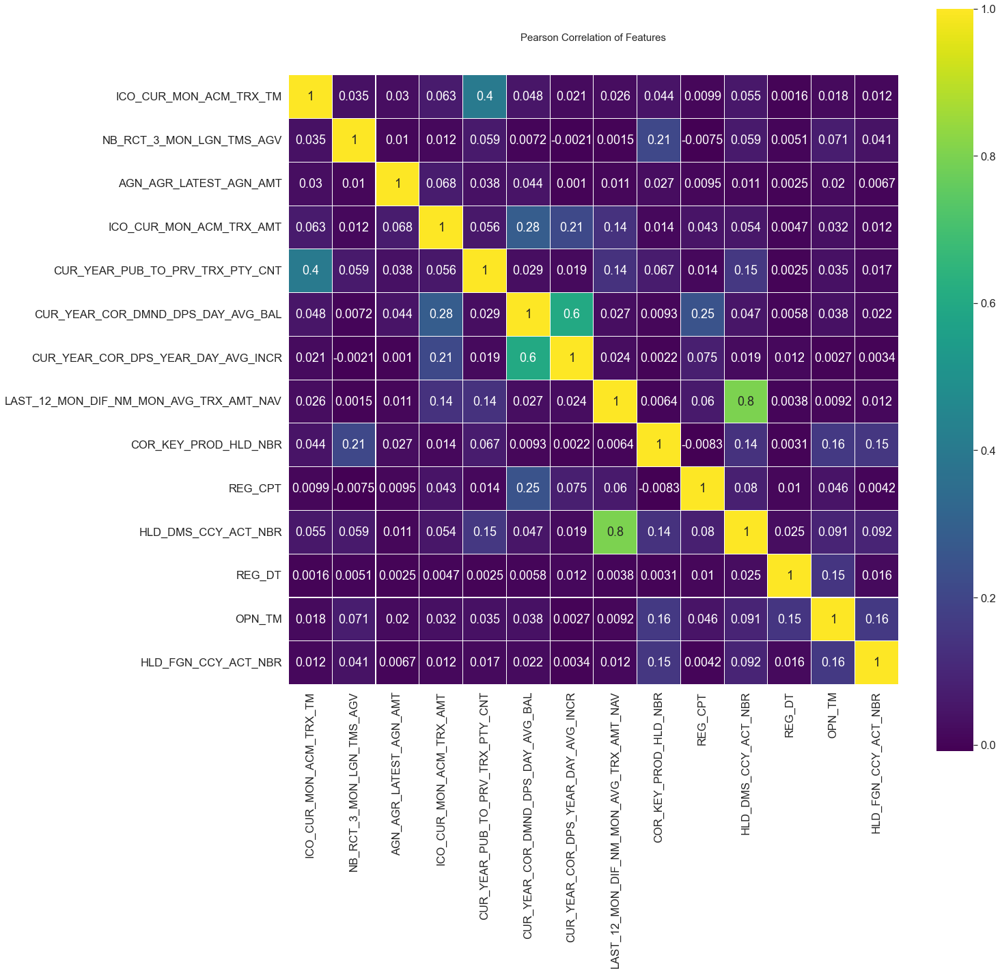

In [1184]:
colormap = plt.cm.viridis
plt.figure(figsize=(20,20))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(x_feature[col_filter].corr(),linewidths=0.1,vmax=1.0, square=True, cmap=colormap, linecolor='white', annot=True)

In [1185]:
dropcols = ['HLD_FGN_CCY_ACT_NBR', 'ICO_CUR_MON_ACM_TRX_TM','CUR_YEAR_COR_DPS_YEAR_DAY_AVG_INCR']

In [1188]:
features = list(x_feature.columns)
features

['AGN_CNT_RCT_12_MON',
 'NB_RCT_3_MON_LGN_TMS_AGV',
 'AGN_CUR_YEAR_WAG_AMT',
 'AGN_AGR_LATEST_AGN_AMT',
 'ICO_CUR_MON_ACM_TRX_AMT',
 'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
 'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
 'MON_12_EXT_SAM_AMT',
 'MON_12_TRX_AMT_MAX_AMT_PCTT',
 'MON_12_ACM_ENTR_ACT_CNT',
 'MON_12_ACM_LVE_ACT_CNT',
 'MON_12_AGV_LVE_ACT_CNT',
 'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
 'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
 'COR_KEY_PROD_HLD_NBR',
 'CUR_YEAR_MID_BUS_INC',
 'REG_CPT',
 'HLD_DMS_CCY_ACT_NBR',
 'REG_DT',
 'OPN_TM',
 'AI_STAR_SCO',
 'WTHR_OPN_ONL_ICO',
 'SHH_BCK',
 'LGP_HLD_CARD_LVL',
 'NB_CTC_HLD_IDV_AIO_CARD_SITU']

In [1191]:
new_features = ['AGN_CNT_RCT_12_MON',
 'NB_RCT_3_MON_LGN_TMS_AGV',
 'AGN_CUR_YEAR_WAG_AMT',
 'AGN_AGR_LATEST_AGN_AMT',
 # 'ICO_CUR_MON_ACM_TRX_AMT',
 'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
 'MON_12_EXT_SAM_NM_TRSF_OUT_CNT',
 'MON_12_EXT_SAM_AMT',
 'MON_12_TRX_AMT_MAX_AMT_PCTT',
 'MON_12_ACM_ENTR_ACT_CNT',
 'MON_12_ACM_LVE_ACT_CNT',
 'MON_12_AGV_LVE_ACT_CNT',
 'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT',
 # 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
 'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
 'COR_KEY_PROD_HLD_NBR',
 'CUR_YEAR_MID_BUS_INC',
 'REG_CPT',
 # 'HLD_DMS_CCY_ACT_NBR',
 'REG_DT',
 'OPN_TM',
 'AI_STAR_SCO',
 'WTHR_OPN_ONL_ICO',
 'SHH_BCK',
 'LGP_HLD_CARD_LVL',
 'NB_CTC_HLD_IDV_AIO_CARD_SITU']

In [632]:
df1.shape

(37237, 36)

In [633]:
df1_ = df1[list(col_filter)]

In [634]:
df2_ = df2[list(col_filter)]

In [637]:
df1_.drop(columns = dropcols, inplace =True)
df2_.drop(columns = dropcols, inplace =True)

SettingWithCopyError: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [646]:
quanlitive

['AI_STAR_SCO',
 'WTHR_OPN_ONL_ICO',
 'SHH_BCK',
 'LGP_HLD_CARD_LVL',
 'NB_CTC_HLD_IDV_AIO_CARD_SITU']

In [654]:
df1_.columns
df2_.columns
new_cols = ['NB_RCT_3_MON_LGN_TMS_AGV', 'AGN_CUR_YEAR_WAG_AMT',
       'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
       'CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT', 'CUR_YEAR_COR_DMND_DPS_DAY_AVG_BAL',
        'CUR_YEAR_MID_BUS_INC',
       'HLD_DMS_CCY_ACT_NBR', 'HLD_FGN_CCY_ACT_NBR', 'MON_6_50_UP_NET_ACT_CNT',
        'LAST_12_MON_COR_DPS_DAY_GAP', 'AI_STAR_SCO',
         'WTHR_OPN_ONL_ICO',
         'SHH_BCK',
         'LGP_HLD_CARD_LVL',
         'NB_CTC_HLD_IDV_AIO_CARD_SITU']
len(new_cols)

15

In [1196]:
#随机森林算法判定特征的重要性
from sklearn.ensemble import RandomForestClassifier
clf=RandomForestClassifier(n_estimators=10,random_state=123)#构建分类随机森林分类器
clf.fit(df1[new_features], df1['LABEL']) #对自变量和因变量进行拟合
new_features, clf.feature_importances_
for feature in zip(new_features, clf.feature_importances_):
    print(feature)

('AGN_CNT_RCT_12_MON', 0.035032036008512436)
('NB_RCT_3_MON_LGN_TMS_AGV', 0.06990839415944765)
('AGN_CUR_YEAR_WAG_AMT', 0.02713322728762068)
('AGN_AGR_LATEST_AGN_AMT', 0.03937684002787443)
('PUB_TO_PRV_TRX_AMT_CUR_YEAR', 0.04306616427454361)
('MON_12_EXT_SAM_NM_TRSF_OUT_CNT', 0.028133391046410206)
('MON_12_EXT_SAM_AMT', 0.04619154341671512)
('MON_12_TRX_AMT_MAX_AMT_PCTT', 0.03799528674043876)
('MON_12_ACM_ENTR_ACT_CNT', 0.07412137321404902)
('MON_12_ACM_LVE_ACT_CNT', 0.051418259244942296)
('MON_12_AGV_LVE_ACT_CNT', 0.050774307307189424)
('CUR_YEAR_PUB_TO_PRV_TRX_PTY_CNT', 0.02642980462957259)
('LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV', 0.048417164780775165)
('COR_KEY_PROD_HLD_NBR', 0.02821983520516061)
('CUR_YEAR_MID_BUS_INC', 0.05954348940766234)
('REG_CPT', 0.059825277954947874)
('REG_DT', 0.07830492884548844)
('OPN_TM', 0.08156180511079406)
('AI_STAR_SCO', 0.033009685473340634)
('WTHR_OPN_ONL_ICO', 0.00766752684110267)
('SHH_BCK', 0.014645892525966795)
('LGP_HLD_CARD_LVL', 0.02866001

In [1232]:
important_features = [                     'NB_RCT_3_MON_LGN_TMS_AGV',
                      'MON_12_ACM_ENTR_ACT_CNT',
                      'MON_12_ACM_LVE_ACT_CNT',
                      'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
                      'CUR_YEAR_MID_BUS_INC',
                      'REG_DT',
                      'REG_CPT',
                      'OPN_TM',
                      'MON_12_EXT_SAM_AMT',
                      # 'LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV',
                      'PUB_TO_PRV_TRX_AMT_CUR_YEAR',
                      'AGN_AGR_LATEST_AGN_AMT'
                      
                      
                      
                     ]

In [1198]:
X = df1[new_features]
y = df1["LABEL"]
n_sample = y.shape[0]
n_pos_sample = y[y == 0].shape[0]
n_neg_sample = y[y == 1].shape[0]
print('样本个数：{}; 正样本占{:.2%}; 负样本占{:.2%}'.format(n_sample,
n_pos_sample / n_sample,
n_neg_sample / n_sample))
print('特征维数：', X.shape[1])

样本个数：40000; 正样本占75.00%; 负样本占25.00%
特征维数： 23


In [1199]:
from imblearn.over_sampling import SMOTE # 导入SMOTE算法模块
# 处理不平衡数据
sm = SMOTE(random_state=42)    # 处理过采样的方法
X, y = sm.fit_resample(X, y)
print('通过SMOTE方法平衡正负样本后')
n_sample = y.shape[0]
n_pos_sample = y[y == 0].shape[0]
n_neg_sample = y[y == 1].shape[0]
print('样本个数：{}; 正样本占{:.2%}; 负样本占{:.2%}'.format(n_sample,
                                                   n_pos_sample / n_sample,
                                                   n_neg_sample / n_sample))

通过SMOTE方法平衡正负样本后
样本个数：60000; 正样本占50.00%; 负样本占50.00%


In [1200]:
X.drop(columns = quanlitive, inplace = True)

In [1201]:
# 构建逻辑回归分类器
X.drop(columns= 'LABEL', inplace = True)

KeyError: "['LABEL'] not found in axis"

In [1207]:
from sklearn.linear_model import LogisticRegression
clf1 = LogisticRegression() 
clf1.fit(df1[new_features], df1['LABEL'])

D:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [1209]:
# 查看预测结果的准确率

predicted1 = clf1.predict(df1[new_features]) # 通过分类器产生预测结果

In [1211]:
from sklearn.metrics import accuracy_score
print("Test set accuracy score: {:.5f}".format(accuracy_score(predicted1, df1['LABEL'])))

Test set accuracy score: 0.74977


In [1212]:
df2.shape

(12000, 39)

In [1233]:
xtest = df2[important_features]

In [1234]:
important_features.append('LABEL')

In [1235]:
x_train = df1[important_features]
x_train.describe().T

,count,mean,std,min,25%,50%,75%,max
NB_RCT_3_MON_LGN_TMS_AGV,40000.0,0.003127,0.007043,0.0,7.040853e-04,1.664638e-03,0.003714,1.0
MON_12_ACM_ENTR_ACT_CNT,40000.0,0.000100,0.005127,0.0,2.146881e-06,7.820782e-06,0.000030,1.0
MON_12_ACM_LVE_ACT_CNT,40000.0,0.000050,0.005019,0.0,1.142089e-06,4.789404e-06,0.000014,1.0
LAST_12_MON_DIF_NM_MON_AVG_TRX_AMT_NAV,40000.0,0.000045,0.005042,0.0,2.943246e-07,1.109341e-06,0.000005,1.0
CUR_YEAR_MID_BUS_INC,40000.0,0.169353,0.004530,0.0,1.692673e-01,1.692680e-01,0.169272,1.0
REG_DT,40000.0,0.004449,0.018978,0.0,1.544688e-03,2.880472e-03,0.005760,1.0
REG_CPT,40000.0,0.000932,0.010978,0.0,1.461198e-05,4.870660e-05,0.000195,1.0
OPN_TM,40000.0,0.182397,0.162312,0.0,6.127843e-02,1.312840e-01,0.243785,1.0
MON_12_EXT_SAM_AMT,40000.0,0.352421,0.004929,0.0,3.523974e-01,3.523975e-01,0.352397,1.0
PUB_TO_PRV_TRX_AMT_CUR_YEAR,40000.0,0.000496,0.007282,0.0,0.000000e+00,1.644350e-07,0.000125,1.0


In [1236]:
time_limit = 180  # 这里设置 60 秒仅用于快速演示代码，在实际中应该设置为你愿意等待的最长时间（以秒为单位）

# 载入包
from autogluon.tabular import TabularDataset, TabularPredictor
# 载入训练数据
train_data = x_train.iloc[:30000,:]

In [1237]:
# 建模
metric = 'roc_auc'  # 指定模型性能指标，这里为 AUC
predictor = TabularPredictor('LABEL', eval_metric=metric).fit(train_data, time_limit=time_limit, presets='best_quality')
# 载入测试数据
test_data = x_train.iloc[30000:,:]
# 查看模型性能排名
predictor.leaderboard(test_data, silent=True)

No path specified. Models will be saved in: "AutogluonModels/ag-20220509_001435\"
Presets specified: ['best_quality']
Beginning AutoGluon training ... Time limit = 180s
AutoGluon will save models to "AutogluonModels/ag-20220509_001435\"
AutoGluon Version:  0.4.0
Python Version:     3.9.7
Operating System:   Windows
Train Data Rows:    30000
Train Data Columns: 11
Label Column: LABEL
Preprocessing data ...
AutoGluon infers your prediction problem is: 'binary' (because only two unique label-values observed).
	2 unique label values:  [0, 1]
	If 'binary' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Selected class <--> label mapping:  class 1 = 1, class 0 = 0
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    1859.98 MB
	Train Data (Original)  Memory Usage: 2.64 MB (0.1% 

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,RandomForestEntr_BAG_L2,0.689601,0.695712,2.121164,4.498095,20.477676,0.280773,1.059999,11.229553,2,True,9
1,WeightedEnsemble_L3,0.688887,0.696977,2.407593,5.840171,26.811499,0.003000,0.007002,1.580988,3,True,10
2,WeightedEnsemble_L2,0.687113,0.693143,1.730386,3.144019,12.747917,0.003995,0.006933,3.578792,2,True,7
3,RandomForestEntr_BAG_L1,0.683333,0.687744,0.394777,0.816999,4.236721,0.394777,0.816999,4.236721,1,True,4
4,ExtraTreesEntr_BAG_L1,0.681697,0.678126,0.476607,0.742008,0.998763,0.476607,0.742008,0.998763,1,True,6
5,RandomForestGini_BAG_L2,0.681600,0.687868,2.123820,4.773170,14.000958,0.283429,1.335074,4.752834,2,True,8
6,RandomForestGini_BAG_L1,0.679886,0.680411,0.370007,0.838079,2.957995,0.370007,0.838079,2.957995,1,True,3
7,ExtraTreesGini_BAG_L1,0.677588,0.678791,0.484999,0.740000,0.975647,0.484999,0.740000,0.975647,1,True,5
8,KNeighborsUnif_BAG_L1,0.567243,0.566901,0.050989,0.168001,0.049999,0.050989,0.168001,0.049999,1,True,1
9,KNeighborsDist_BAG_L1,0.564878,0.567167,0.063012,0.133009,0.029000,0.063012,0.133009,0.029000,1,True,2


In [1238]:
predict_proba = predictor.predict_proba(x_test)
predict_proba.iloc[:,1:].values.reshape(-1)

array([0.17657143, 0.31476191, 0.24476191, ..., 0.14957142, 0.25252381,
       0.08728571])

In [1239]:
predict_proba

,0,1
0,0.823429,0.176571
1,0.685238,0.314762
2,0.755238,0.244762
3,0.753762,0.246238
4,0.897048,0.102952
...,...,...
11995,0.862810,0.137190
11996,0.677381,0.322619
11997,0.850429,0.149571
11998,0.747476,0.252524


In [1240]:
pd.DataFrame(predict_proba.iloc[:,1:].values.reshape(-1)).to_csv('Sample Submission 5.9.2.csv')